In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


In [2]:
company_list = ["AAPL_data.csv",'GOOG_data.csv','MSFT_data.csv','AMZN_data.csv','IBM_data.csv','NSC_data.csv','ORCL_data.csv','XRAY_data.csv','TPR_data.csv','TRIP_data.csv']

In [3]:
path=r'C:\Users\LENOVO\Documents\New folder\individual_stocks_5yr'
all_data=pd.DataFrame()
for file in company_list:
    current_df=pd.read_csv(path+'/'+file)
    all_data=pd.concat([all_data,current_df])
   

In [4]:
all_data.shape

(12304, 7)

In [5]:
all_data.isna().sum()

date      0
open      0
high      0
low       0
close     0
volume    0
Name      0
dtype: int64

## ANALYSING CLOSING PRICE OF ALL THE STOCKS

In [6]:
tech_list=all_data['Name'].unique()
all_data.dtypes

date       object
open      float64
high      float64
low       float64
close     float64
volume      int64
Name       object
dtype: object

In [7]:
tech_list


array(['AAPL', 'GOOG', 'MSFT', 'AMZN', 'IBM', 'NSC', 'ORCL', 'XRAY',
       'TPR', 'TRIP'], dtype=object)

In [8]:
all_data['date']=pd.to_datetime(all_data['date'])

In [9]:
all_data

,date,open,high,low,close,volume,Name
0,2013-02-08,67.7142,68.4014,66.8928,67.8542,158168416,AAPL
1,2013-02-11,68.0714,69.2771,67.6071,68.5614,129029425,AAPL
2,2013-02-12,68.5014,68.9114,66.8205,66.8428,151829363,AAPL
3,2013-02-13,66.7442,67.6628,66.1742,66.7156,118721995,AAPL
4,2013-02-14,66.3599,67.3771,66.2885,66.6556,88809154,AAPL
...,...,...,...,...,...,...,...
1254,2018-02-01,34.2800,34.9500,34.2300,34.6200,1516931,TRIP
1255,2018-02-02,34.4400,34.9300,34.0791,34.3500,1493803,TRIP
1256,2018-02-05,34.3400,36.2000,34.1800,35.6200,4758249,TRIP
1257,2018-02-06,34.8900,41.3100,34.7600,40.8400,11626468,TRIP


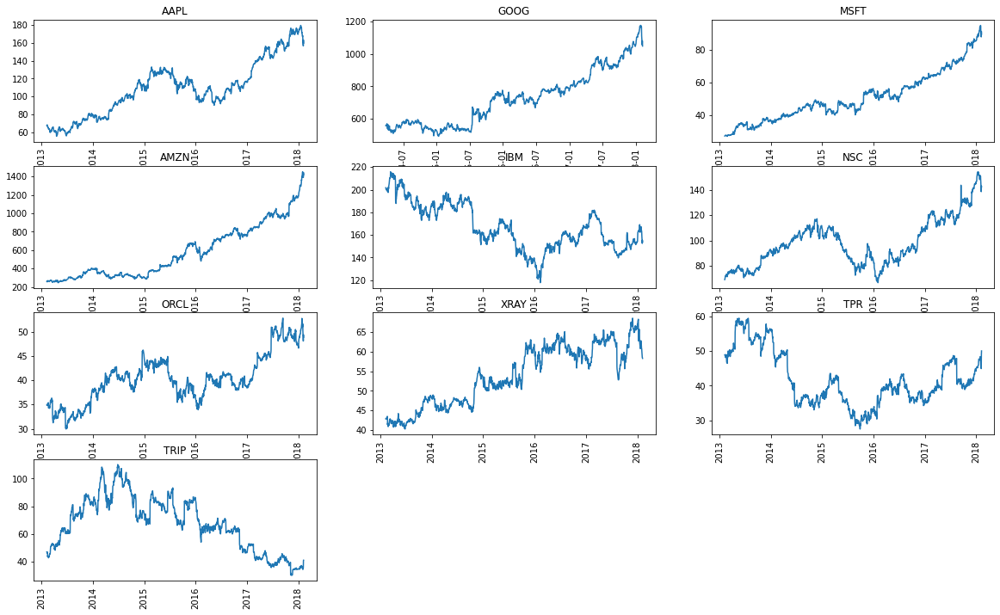

In [10]:
plt.figure(figsize=(20,12))
for i,company in enumerate(tech_list,1):
    plt.subplot(4,3,i)
    df=all_data[all_data['Name']==company]
    plt.plot(df['date'],df['close'])

    plt.xticks(rotation='vertical')
    plt.title(company)

##  ANALYSE TOTAL VOLUME OF STOCK BEING TRADED EACH DAY

In [11]:
import plotly.express as px

In [12]:
all_data['daily_price_change']=all_data['close']-all_data['open']

In [13]:
all_data

,date,open,high,low,close,volume,Name,daily_price_change
0,2013-02-08,67.7142,68.4014,66.8928,67.8542,158168416,AAPL,0.1400
1,2013-02-11,68.0714,69.2771,67.6071,68.5614,129029425,AAPL,0.4900
2,2013-02-12,68.5014,68.9114,66.8205,66.8428,151829363,AAPL,-1.6586
3,2013-02-13,66.7442,67.6628,66.1742,66.7156,118721995,AAPL,-0.0286
4,2013-02-14,66.3599,67.3771,66.2885,66.6556,88809154,AAPL,0.2957
...,...,...,...,...,...,...,...,...
1254,2018-02-01,34.2800,34.9500,34.2300,34.6200,1516931,TRIP,0.3400
1255,2018-02-02,34.4400,34.9300,34.0791,34.3500,1493803,TRIP,-0.0900
1256,2018-02-05,34.3400,36.2000,34.1800,35.6200,4758249,TRIP,1.2800
1257,2018-02-06,34.8900,41.3100,34.7600,40.8400,11626468,TRIP,5.9500


In [14]:
for company in tech_list:
    df=all_data[all_data['Name']==company]
    fig=px.line(df,x='date',y='volume',title=company)
fig.show()

## ANALYSE DAILY PRICE CHANGE IN STOCK

In [15]:
tech_list

array(['AAPL', 'GOOG', 'MSFT', 'AMZN', 'IBM', 'NSC', 'ORCL', 'XRAY',
       'TPR', 'TRIP'], dtype=object)

In [16]:
df=all_data

In [17]:
all_data

,date,open,high,low,close,volume,Name,daily_price_change
0,2013-02-08,67.7142,68.4014,66.8928,67.8542,158168416,AAPL,0.1400
1,2013-02-11,68.0714,69.2771,67.6071,68.5614,129029425,AAPL,0.4900
2,2013-02-12,68.5014,68.9114,66.8205,66.8428,151829363,AAPL,-1.6586
3,2013-02-13,66.7442,67.6628,66.1742,66.7156,118721995,AAPL,-0.0286
4,2013-02-14,66.3599,67.3771,66.2885,66.6556,88809154,AAPL,0.2957
...,...,...,...,...,...,...,...,...
1254,2018-02-01,34.2800,34.9500,34.2300,34.6200,1516931,TRIP,0.3400
1255,2018-02-02,34.4400,34.9300,34.0791,34.3500,1493803,TRIP,-0.0900
1256,2018-02-05,34.3400,36.2000,34.1800,35.6200,4758249,TRIP,1.2800
1257,2018-02-06,34.8900,41.3100,34.7600,40.8400,11626468,TRIP,5.9500


In [18]:
df['1day % return']=((df['close']-df['open'])/df['close'])*100

In [19]:
df

,date,open,high,low,close,volume,Name,daily_price_change,1day % return
0,2013-02-08,67.7142,68.4014,66.8928,67.8542,158168416,AAPL,0.1400,0.206325
1,2013-02-11,68.0714,69.2771,67.6071,68.5614,129029425,AAPL,0.4900,0.714688
2,2013-02-12,68.5014,68.9114,66.8205,66.8428,151829363,AAPL,-1.6586,-2.481344
3,2013-02-13,66.7442,67.6628,66.1742,66.7156,118721995,AAPL,-0.0286,-0.042869
4,2013-02-14,66.3599,67.3771,66.2885,66.6556,88809154,AAPL,0.2957,0.443624
...,...,...,...,...,...,...,...,...,...
1254,2018-02-01,34.2800,34.9500,34.2300,34.6200,1516931,TRIP,0.3400,0.982091
1255,2018-02-02,34.4400,34.9300,34.0791,34.3500,1493803,TRIP,-0.0900,-0.262009
1256,2018-02-05,34.3400,36.2000,34.1800,35.6200,4758249,TRIP,1.2800,3.593487
1257,2018-02-06,34.8900,41.3100,34.7600,40.8400,11626468,TRIP,5.9500,14.569050


In [20]:
    fig=px.line(all_data,x='date',y='1day % return',title=company)

In [21]:
fig.show()

## ANALYSE MONTHLY MEAN 

In [22]:
df2=df.copy()

In [23]:
profit=df2

In [24]:
df2.dtypes

date                  datetime64[ns]
open                         float64
high                         float64
low                          float64
close                        float64
volume                         int64
Name                          object
daily_price_change           float64
1day % return                float64
dtype: object

In [25]:
df2.set_index('date',inplace=True)

In [26]:
df2

,open,high,low,close,volume,Name,daily_price_change,1day % return
date,,,,,,,,
2013-02-08,67.7142,68.4014,66.8928,67.8542,158168416,AAPL,0.1400,0.206325
2013-02-11,68.0714,69.2771,67.6071,68.5614,129029425,AAPL,0.4900,0.714688
2013-02-12,68.5014,68.9114,66.8205,66.8428,151829363,AAPL,-1.6586,-2.481344
2013-02-13,66.7442,67.6628,66.1742,66.7156,118721995,AAPL,-0.0286,-0.042869
2013-02-14,66.3599,67.3771,66.2885,66.6556,88809154,AAPL,0.2957,0.443624
...,...,...,...,...,...,...,...,...
2018-02-01,34.2800,34.9500,34.2300,34.6200,1516931,TRIP,0.3400,0.982091
2018-02-02,34.4400,34.9300,34.0791,34.3500,1493803,TRIP,-0.0900,-0.262009
2018-02-05,34.3400,36.2000,34.1800,35.6200,4758249,TRIP,1.2800,3.593487


In [27]:
df2['close'].resample('M').mean()

date
2013-02-28     88.754275
2013-03-31     91.128862
2013-04-30     90.127548
2013-05-31     93.052401
2013-06-30     93.303002
                 ...    
2017-10-31    269.030091
2017-11-30    289.694571
2017-12-31    295.724200
2018-01-31    321.480905
2018-02-28    325.303200
Freq: M, Name: close, Length: 61, dtype: float64

<AxesSubplot:xlabel='date'>

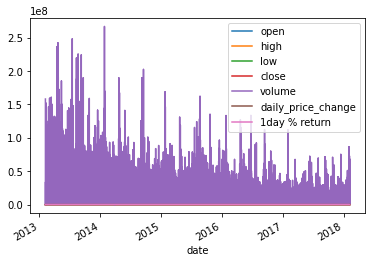

In [28]:
df2.plot()

In [29]:
df2.index

DatetimeIndex(['2013-02-08', '2013-02-11', '2013-02-12', '2013-02-13',
               '2013-02-14', '2013-02-15', '2013-02-19', '2013-02-20',
               '2013-02-21', '2013-02-22',
               ...
               '2018-01-25', '2018-01-26', '2018-01-29', '2018-01-30',
               '2018-01-31', '2018-02-01', '2018-02-02', '2018-02-05',
               '2018-02-06', '2018-02-07'],
              dtype='datetime64[ns]', name='date', length=12304, freq=None)

<AxesSubplot:xlabel='date'>

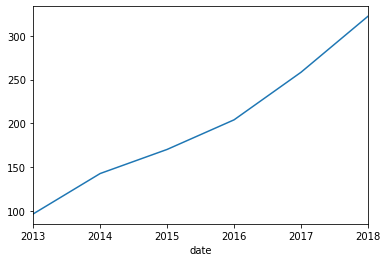

In [30]:
df2['close'].resample('Y').mean().plot()

## ANALYSE WHEATHER STOCK PRICES OF THESE EACH COMPANIES ARE CORRELATED OR NOT(AMAZON,GOOGLE,MICROSOFT,APPLE)

In [31]:
apple=pd.read_csv(r'C:\Users\LENOVO\Desktop\New folder\individual_stocks_5yr/AAPL_data.csv')


In [32]:
apple['daily_price_change']=apple['close']-apple['open']

In [33]:
px.line(apple,x='date',y='daily_price_change')

In [34]:
fig=px.line(all_data,x='date',y='1day % return',title=company)

<AxesSubplot:>

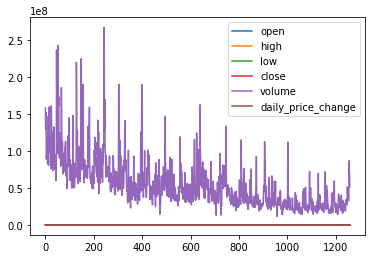

In [35]:
apple.plot()

In [36]:
amazon=pd.read_csv(r'C:\Users\LENOVO\Desktop\New folder\individual_stocks_5yr/AMZN_data.csv')


In [37]:
amazon['daily_price_change']=amazon['close']-amazon['open']

In [38]:
amazon

,date,open,high,low,close,volume,Name,daily_price_change
0,2013-02-08,261.40,265.25,260.555,261.95,3879078,AMZN,0.55
1,2013-02-11,263.20,263.25,256.600,257.21,3403403,AMZN,-5.99
2,2013-02-12,259.19,260.16,257.000,258.70,2938660,AMZN,-0.49
3,2013-02-13,261.53,269.96,260.300,269.47,5292996,AMZN,7.94
4,2013-02-14,267.37,270.65,265.400,269.24,3462780,AMZN,1.87
...,...,...,...,...,...,...,...,...
1254,2018-02-01,1445.00,1459.88,1385.140,1390.00,9113808,AMZN,-55.00
1255,2018-02-02,1477.39,1498.00,1414.000,1429.95,11125722,AMZN,-47.44
1256,2018-02-05,1402.62,1458.98,1320.720,1390.00,11494985,AMZN,-12.62
1257,2018-02-06,1361.46,1443.99,1351.790,1442.84,11066819,AMZN,81.38


In [39]:
microsoft=pd.read_csv(r'C:\Users\LENOVO\Desktop\New folder\individual_stocks_5yr/MSFT_data.csv')


In [40]:
microsoft['daily_price_change']=microsoft['close']-microsoft['open']


In [41]:
google=pd.read_csv(r'C:\Users\LENOVO\Desktop\New folder\individual_stocks_5yr/GOOG_data.csv')


In [42]:
google['daily_price_change']=google['close']-google['open']


In [43]:
ibm=pd.read_csv(r'C:\Users\LENOVO\Desktop\New folder\individual_stocks_5yr/IBM_data.csv')


In [44]:
ibm['daily_price_change']=ibm['close']-ibm['open']


In [45]:
itc=pd.read_csv(r'C:\Users\LENOVO\Desktop\New folder\individual_stocks_5yr/NSC_data.csv')


In [46]:
itc['daily_price_change']=itc['close']-itc['open']



In [47]:
hul=pd.read_csv(r'C:\Users\LENOVO\Desktop\New folder\individual_stocks_5yr/ORCL_data.csv')


In [48]:
hul['daily_price_change']=hul['close']-hul['open']


In [49]:
infosys=pd.read_csv(r'C:\Users\LENOVO\Desktop\New folder\individual_stocks_5yr/XRAY_data.csv')


In [50]:
infosys['daily_price_change']=infosys['close']-infosys['open']


In [51]:
icici_bank=pd.read_csv(r'C:\Users\LENOVO\Desktop\New folder\individual_stocks_5yr/TPR_data.csv')


In [52]:
icici_bank['daily_price_change']=icici_bank['close']-icici_bank['open']


In [53]:
hdfc_bank=pd.read_csv(r'C:\Users\LENOVO\Desktop\New folder\individual_stocks_5yr/TRIP_data.csv')


In [54]:
hdfc_bank['daily_price_change']=hdfc_bank['close']-hdfc_bank['open']


In [55]:
closing_price=pd.DataFrame()

In [56]:
closing_price['apple']=apple['close']
closing_price['amazon']=amazon['close']
closing_price['microsoft']=microsoft['close']
closing_price['google']=google['close']
closing_price['ibm']=ibm['close']
closing_price['itc']=itc['close']
closing_price['hul']=hul['close']
closing_price['infosys']=infosys['close']
closing_price['icici_bank']=icici_bank['close']
closing_price['hdfc_bank']=hdfc_bank['close']

In [57]:
closing_price.head()

,apple,amazon,microsoft,google,ibm,itc,hul,infosys,icici_bank,hdfc_bank
0,67.8542,261.95,27.55,558.46,201.68,69.00,34.90,42.87,48.93,47.02
1,68.5614,257.21,27.86,559.99,200.16,70.57,34.96,42.84,48.93,46.23
2,66.8428,258.70,27.88,556.97,200.04,71.64,35.11,42.87,49.01,46.66
3,66.7156,269.47,28.03,567.16,200.09,71.88,34.99,43.08,48.77,46.90
4,66.6556,269.24,28.04,567.00,199.65,71.97,34.90,42.91,48.20,43.55


## DRAWING A PAIR PLOT USING SEABORN TO FIND THE CORRELATION BETWEEN CLOSING PRICE OF STOCKS

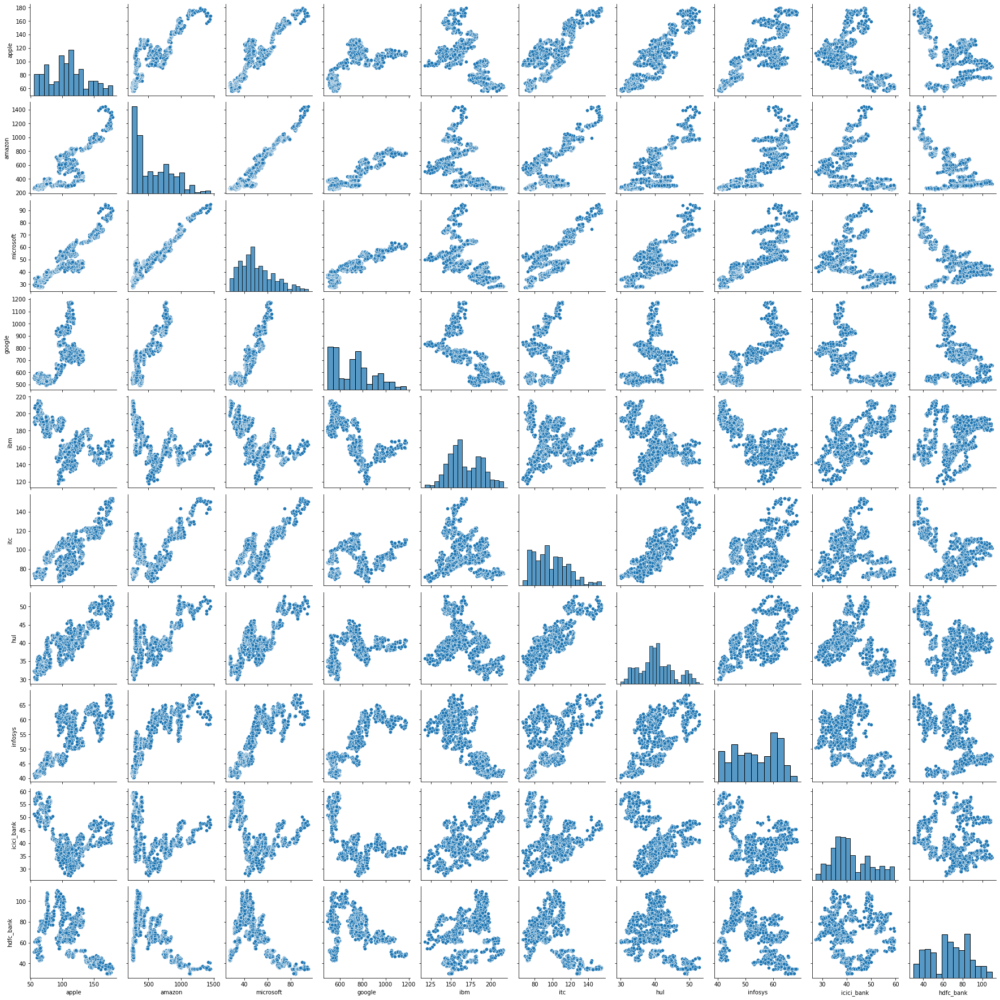

In [58]:
sns.pairplot(data=closing_price)

## DRAWING A HEATMAP TO FIND THE RELATION BETWEEN CLOSING PRICE OF STOCKS

<AxesSubplot:>

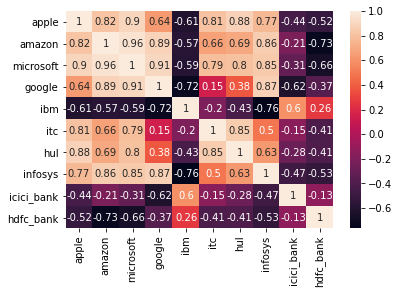

In [59]:
sns.heatmap(closing_price.corr(),annot=True)

## ANALYSE DAILY RETURN OF EACH STOCK(APPLE,MICROSOFT,GOOGLE,AMAZON)

In [60]:
data=pd.DataFrame()

In [61]:
data['apple']=((apple['close']-apple['open'])/apple['close'])*100
data['amazon']=((amazon['close']-amazon['open'])/amazon['close'])*100
data['google']=((google['close']-google['open'])/google['close'])*100
data['microsoft']=((microsoft['close']-microsoft['open'])/microsoft['close'])*100
data['ibm']=((ibm['close']-ibm['open'])/ibm['close'])*100
data['itc']=((itc['close']-itc['open'])/itc['close'])*100
data['hul']=((hul['close']-hul['open'])/hul['close'])*100
data['infosys']=((infosys['close']-infosys['open'])/infosys['close'])*100
data['icici_bank']=((icici_bank['close']-icici_bank['open'])/icici_bank['close'])*100
data['hdfc_bank']=((hdfc_bank['close']-hdfc_bank['open'])/hdfc_bank['close'])*100

<AxesSubplot:>

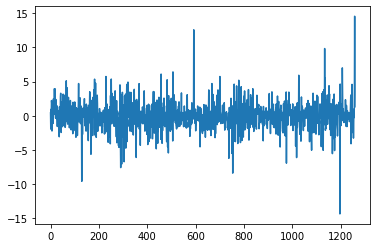

In [62]:
data['hdfc_bank'].plot()

## DRAWING A PAIRPLOT TO FIND THE RELATION BETWEEN CHANGE IN DAILY RETURN OF EACH STOCK

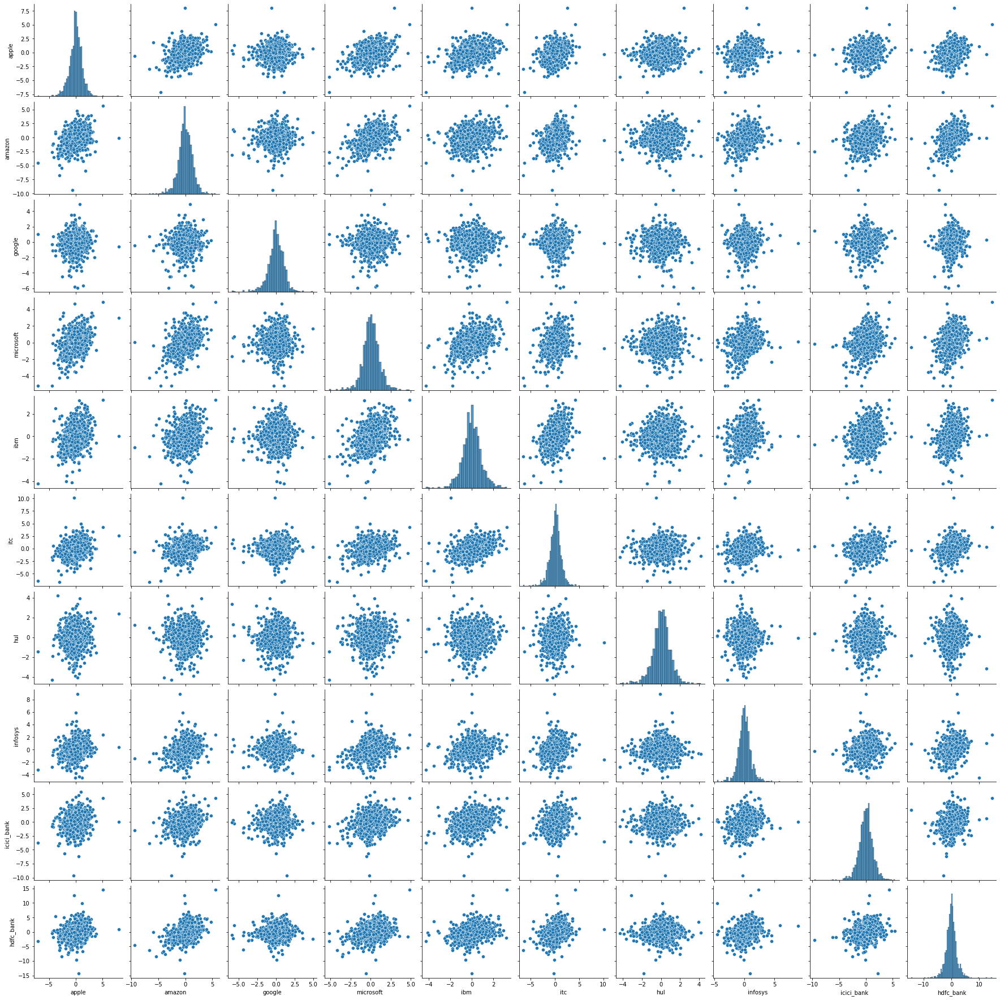

In [63]:
sns.pairplot(data=data)

## DRAWING A HEATMAP TO FIND A CORRELATION BETWEEN CHANGE IN DAILY RETURN OF EACH STOCK

<AxesSubplot:>

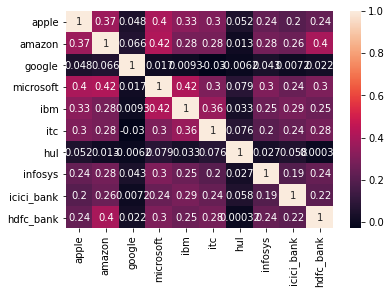

In [64]:
sns.heatmap(data.corr(),annot=True)

c:\users\lenovo\appdata\local\programs\python\python39\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='amazon', ylabel='Density'>

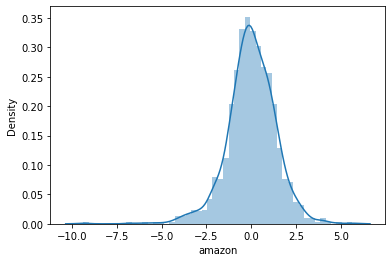

In [65]:
sns.distplot(data['amazon'])

## conclusion of values at risk analysis

In [66]:
data['amazon'].std()
## 68% of entire data

1.3586786099495487

In [67]:
data['amazon'].std()*2
## 95% of etire data

2.7173572198990974

In [68]:
data['amazon'].std()*3
## 99.7% of etire data

4.076035829848646

In [69]:
name=data.columns

In [70]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
apple,1259.0,-0.000215,1.187138,-7.104299,-0.658021,0.042230,0.715427,8.000388
amazon,1259.0,-0.000398,1.358679,-9.363077,-0.738341,-0.002623,0.852568,5.640265
google,975.0,-0.012495,1.092560,-5.952266,-0.551963,0.024951,0.672649,4.943550
microsoft,1259.0,0.076404,1.059260,-5.177618,-0.509241,0.061069,0.703264,4.861491
ibm,1259.0,0.013804,0.874552,-4.242338,-0.486742,0.006366,0.523663,3.250933
itc,1259.0,0.067802,1.249259,-6.606943,-0.620044,0.126562,0.741842,10.121869
hul,1257.0,0.043274,0.967802,-4.287729,-0.495540,0.078206,0.606333,4.190283
infosys,1259.0,0.047730,1.097904,-4.517162,-0.539195,0.039131,0.616055,8.927393
icici_bank,1259.0,-0.000580,1.316676,-9.666573,-0.779903,0.051948,0.751232,5.461078
hdfc_bank,1259.0,-0.024252,2.028824,-14.365733,-1.108873,0.000000,0.993203,14.569050


# Trade bot commands

In [71]:
list=[]
def name(n):
    for i in range(1,4):
        d= data[n].std()*i
        list.append((n,d))
        i=i+1        
    return list,data[n].plot(xlabel='Money Evaluation',ylabel='Change of stock price',title='DAILY FLUCTUATION OF STOCK')
        

([('icici_bank', 1.316676177126133), ('icici_bank', 2.633352354252266), ('icici_bank', 3.950028531378399)], <AxesSubplot:title={'center':'DAILY FLUCTUATION OF STOCK'}, xlabel='Money Evaluation', ylabel='Change of stock price'>)


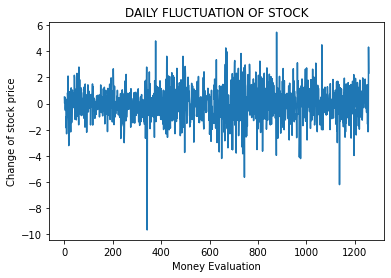

In [72]:
print(name('icici_bank'))

In [73]:
def graph(n):
    fig=px.line(n,x='date',y='volume',title=n)
    return fig

# DAILY volume of stock traded 

In [74]:
fig

In [75]:
from sklearn.model_selection import train_test_split

In [76]:
from sklearn.linear_model import LinearRegression

## yearly price 

In [77]:
def num(name):
    name['close'].resample('Y').mean().plot()

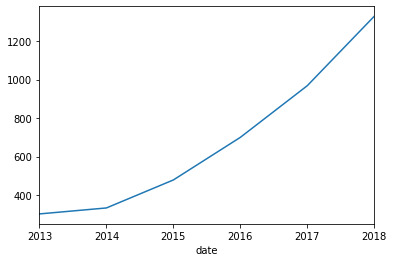

In [84]:
num(amazon)

In [ ]:
amazon

In [ ]:
sns.heatmap(amazon.corr(),annot=True)

In [ ]:
x=amazon.drop([['daily_price_change','Name']],axis=1)

In [ ]:
y=amazon['daily_price_change']

# daily price change in stock

In [79]:
px.line(amazon,x='date',y='daily_price_change')

In [80]:
def name(stock):
    for name in stock:
        name['date']=pd.to_datetime(name['date'])
        name.set_index('date',inplace=True)

In [81]:
stocks=[apple,amazon,google,microsoft,icici_bank,hdfc_bank,ibm,itc,hul,infosys]

In [82]:
name(stocks)

In [83]:
apple

,open,high,low,close,volume,Name,daily_price_change
date,,,,,,,
2013-02-08,67.7142,68.4014,66.8928,67.8542,158168416,AAPL,0.1400
2013-02-11,68.0714,69.2771,67.6071,68.5614,129029425,AAPL,0.4900
2013-02-12,68.5014,68.9114,66.8205,66.8428,151829363,AAPL,-1.6586
2013-02-13,66.7442,67.6628,66.1742,66.7156,118721995,AAPL,-0.0286
2013-02-14,66.3599,67.3771,66.2885,66.6556,88809154,AAPL,0.2957
...,...,...,...,...,...,...,...
2018-02-01,167.1650,168.6200,166.7600,167.7800,47230787,AAPL,0.6150
2018-02-02,166.0000,166.8000,160.1000,160.5000,86593825,AAPL,-5.5000
2018-02-05,159.1000,163.8800,156.0000,156.4900,72738522,AAPL,-2.6100


In [ ]:
apple